## Breast Cancer Tumour Classification

### INTRODUCTION

Breast cancer prediction dataset contains information about different features that can help predict the risk of breast cancer, such as age,diagonis,concavity_mean, and lymph node involvement. It is used to develop models that identify individuals at high risk of developing breast cancer, leading to earlier detection and better outcomes.

### ABSTRACT

This analysis reviews the recent advances in breast cancer tumor classification using machine learning algorithms. It covers the types of data used, machine learning techniques applied, and challenges faced. The use of machine learning algorithms can improve accuracy, reduce time, and lower costs.

#### Importing the Libraries

In Python, a library is a collection of pre-written code that can be imported and used in your own Python program.

Libraries in Python provide a wide range of functionalities, from simple tasks such as string manipulation to more complex tasks such as machine learning and scientific computing. Some popular libraries in Python include NumPy, Pandas, Matplotlib, TensorFlow, Scikit-learn, and many more.

By using libraries, you can save time and effort by not having to write all the code yourself, and you can take advantage of well-tested and optimized code written by other developers. To use a library in your Python program, you typically need to import it at the beginning of your code using the import statement. 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels
import statsmodels.api as sm
import plotly.express as px
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import warnings
warnings.filterwarnings('ignore')

#### Reading the Dataset

Reading a dataset refers to the process of loading data from a file into memory in a format that can be easily manipulated and analyzed using a programming language like Python.

In [2]:
df=pd.read_csv("data.csv")
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


### Column Names and Meanings

id: a unique identifier for each patient in the dataset.

diagnosis: the diagnosis of the breast mass (M = malignant, B = benign).

radius_mean: the mean of the distances from the center to points on the perimeter of the breast mass.

texture_mean: the standard deviation of gray-scale values in the image.

perimeter_mean: the perimeter of the breast mass.

area_mean: the area of the breast mass.

smoothness_mean: the local variation in radius lengths.

compactness_mean: the perimeter^2 / area - 1.0.

concavity_mean: the severity of concave portions of the breast mass.

concave points_mean: the number of concave portions of the breast mass.

symmetry_mean: symmetry of the breast mass.

fractal_dimension_mean: "coastline approximation" - 1.

radius_se: the standard error of the mean distances from the center to points on the perimeter of the breast mass.

texture_se: the standard error of gray-scale values in the image.

perimeter_se: the standard error of the perimeter of the breast mass.

area_se: the standard error of the area of the breast mass.

smoothness_se: the standard error of the local variation in radius lengths.

compactness_se: the standard error of the perimeter^2 / area - 1.0.

concavity_se: the standard error of the severity of concave portions of the breast mass.

concave points_se: the standard error for the number of concave portions of the breast mass.

symmetry_se: the standard error of symmetry of the breast mass.

fractal_dimension_se: the standard error for "coastline approximation" - 1.

radius_worst: the "worst" or largest mean value for mean distances from the center to points on the perimeter of the breast mass.

texture_worst: the "worst" or largest mean value for standard deviation of gray-scale values in the image.

perimeter_worst: the "worst" or largest mean value for the perimeter of the breast mass.

area_worst: the "worst" or largest mean value for the area of the breast mass.

smoothness_worst: the "worst" or largest mean value for local variation in radius lengths.

compactness_worst: the "worst" or largest mean value for perimeter^2 / area - 1.0.

concavity_worst: the "worst" or largest mean value for severity of concave portions of the breast mass.

concave points_worst: the "worst" or largest mean value for the number of concave portions of the breast mass.

symmetry_worst: the "worst" or largest mean value for symmetry of the breast mass.

fractal_dimension_worst: the "worst" or largest mean value for "coastline approximation" - 1.

### Checking the Null values 

Checking for null values in a dataset is an essential step in data analysis, as missing or null values can cause errors or biases in statistical analysis and machine learning models. In Python, the pandas library provides several functions to check for null values in a DataFrame.

In [3]:
df.isnull

<bound method DataFrame.isnull of            id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0      842302         M        17.99         10.38          122.80     1001.0   
1      842517         M        20.57         17.77          132.90     1326.0   
2    84300903         M        19.69         21.25          130.00     1203.0   
3    84348301         M        11.42         20.38           77.58      386.1   
4    84358402         M        20.29         14.34          135.10     1297.0   
..        ...       ...          ...           ...             ...        ...   
564    926424         M        21.56         22.39          142.00     1479.0   
565    926682         M        20.13         28.25          131.20     1261.0   
566    926954         M        16.60         28.08          108.30      858.1   
567    927241         M        20.60         29.33          140.10     1265.0   
568     92751         B         7.76         24.54           47.92      181

In [4]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

The breast cancer dataset does not contain any null or missing values. After loading the dataset and converting it to a Pandas dataframe, we can use the isnull().sum() method to check for missing values. When applied to the breast cancer dataset, this method returns zero for all columns, indicating that there are no missing values
But When it comes to unnamed column there are null values , so lets remove them.

In [5]:
#Reading the Head part of the Dataset.
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [6]:
#Reading the tail part of my Dataset
df.tail()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,NaN


In [7]:
#Info of the Dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [9]:
df.diagnosis.nunique()

2

### Dropping the Null Values

In [10]:
df.drop(['id','Unnamed: 32'],axis=1,inplace=True)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

Therefore , we have successfully dropped the unnamed column , now the dataset do not have any null values.

In [12]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [13]:
df.diagnosis.unique()

array(['M', 'B'], dtype=object)

### Dummy Variables 

In machine learning, a dummy variable (also called an indicator variable) is a binary variable that takes on the values 0 or 1 to represent the presence or absence of a categorical feature. Dummy variables are commonly used in machine learning algorithms to represent categorical data numerically.

In [14]:
df.diagnosis = [1 if each == "M" else 0 for each in df.diagnosis]

In [15]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [16]:
# find the unique values count in our target feature
df["diagnosis"].value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

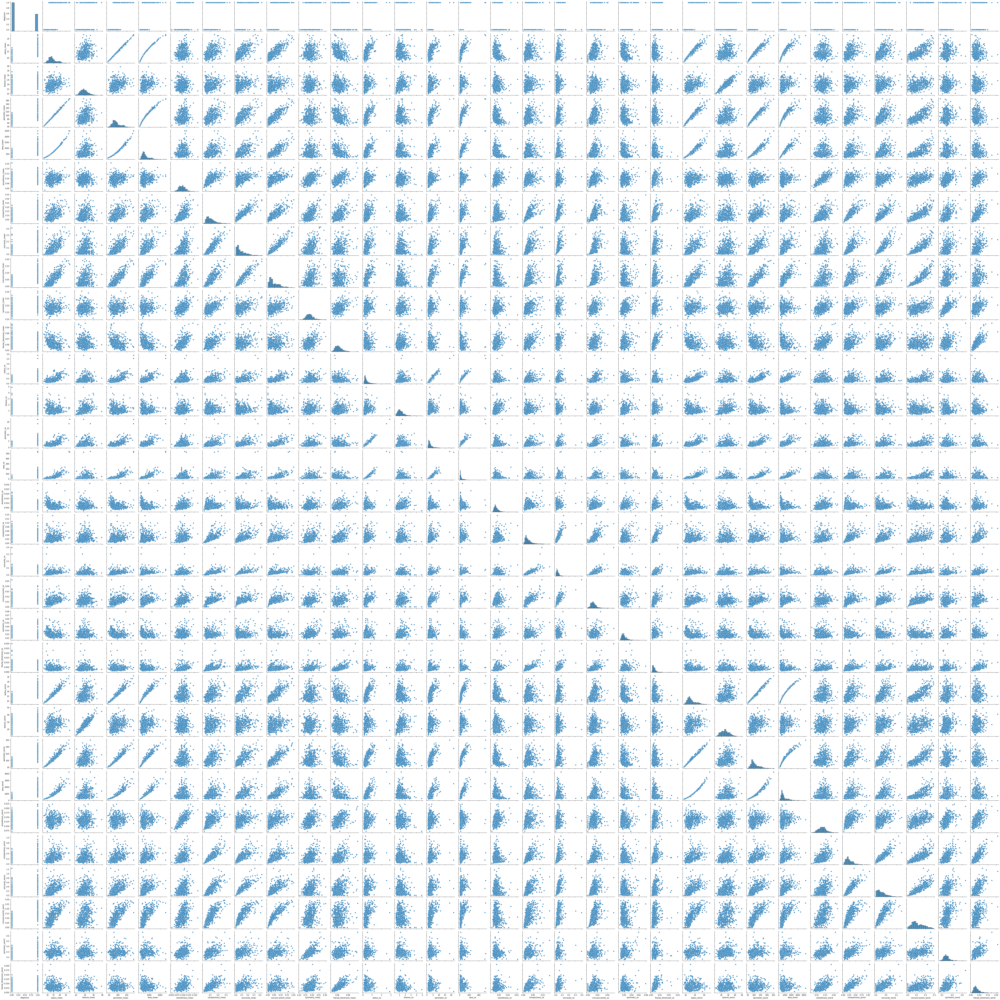

In [17]:
#Pairplot of the Dataset
sns.pairplot(df)

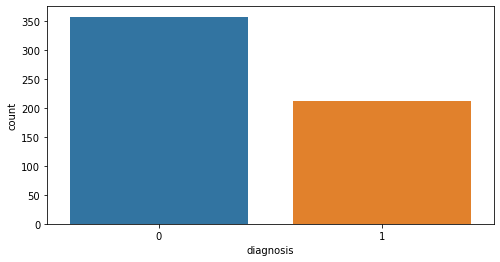

In [18]:
# plot a counter plot to better understand our target feature
plt.figure(figsize=(8,4))
sns.countplot(x = 'diagnosis',data = df)
plt.show()

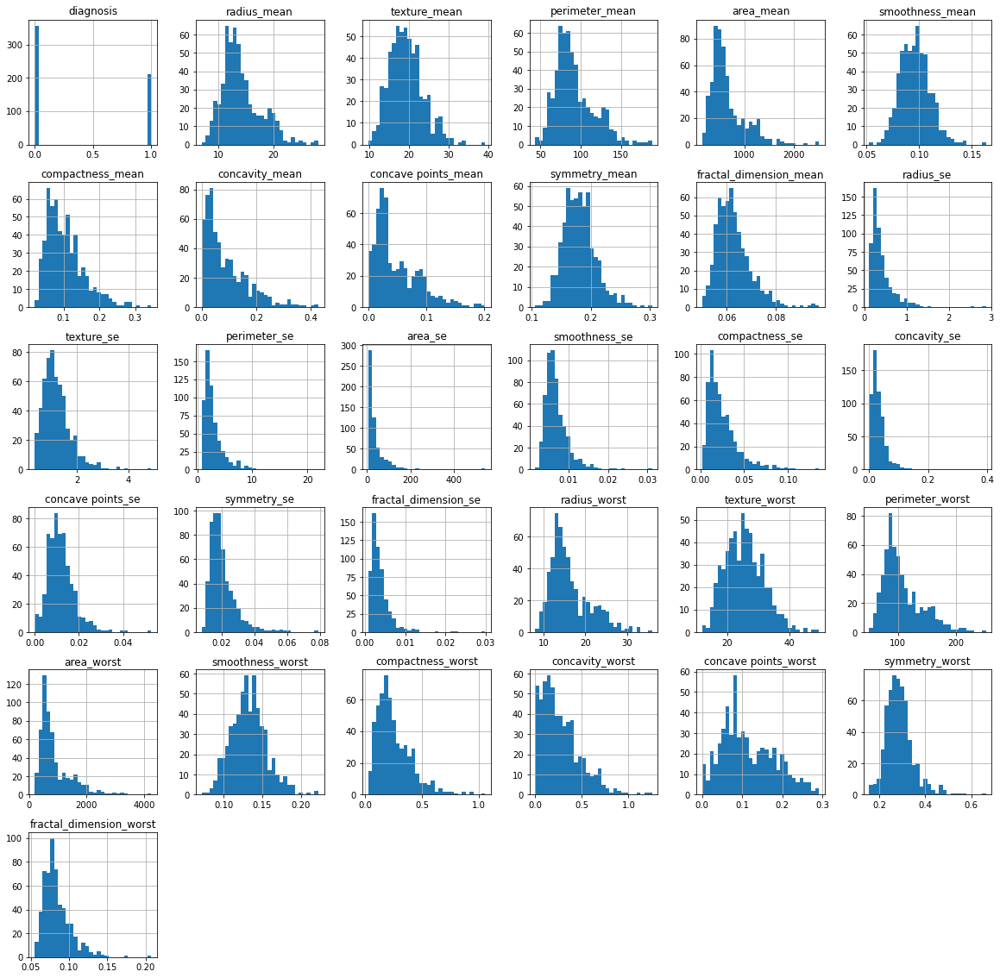

In [19]:
# check the distribution of variables
df.hist(bins=30, figsize=(20,20))
plt.show()

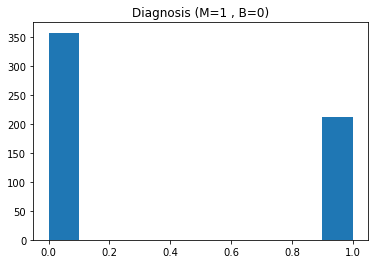

In [20]:
df.describe()
plt.hist(df['diagnosis'])
plt.title('Diagnosis (M=1 , B=0)')
plt.show()

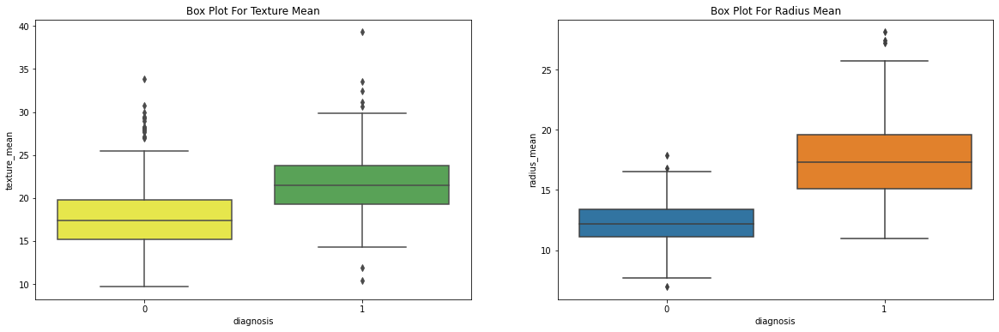

In [21]:
# Box Plot For Our Target Feature
plt.figure(figsize=(20,6))

plt.subplot(1,2,1)
plt.title("Box Plot For Texture Mean")
sns.boxplot(data=df,x="diagnosis",y="texture_mean",palette="Set1_r")

plt.subplot(1,2,2)
plt.title('Box Plot For Radius Mean')
sns.boxplot(data=df,x="diagnosis",y="radius_mean")

plt.show()

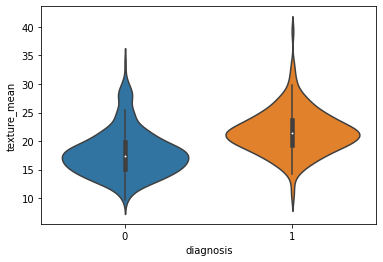

In [22]:
# check the distribution of variables based on target variable
sns.violinplot(x='diagnosis', y='texture_mean', data=df)
plt.show()

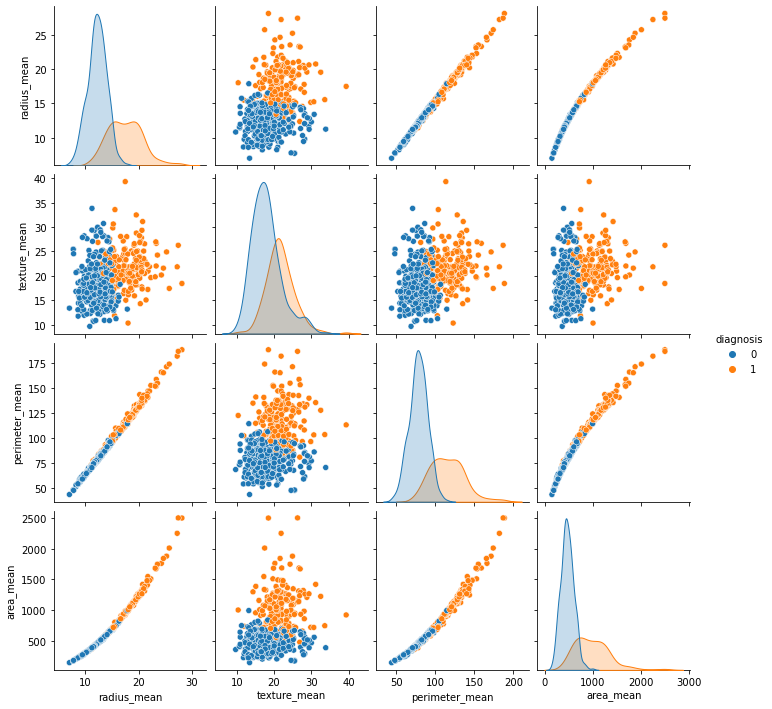

In [23]:
# check the scatter plot between variables
sns.pairplot(df, hue='diagnosis', vars=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean'])
plt.show()

From the scatter plot, we can observe that there is some degree of separation between the two classes for some of the features. For example, the mean radius and mean perimeter features appear to have a somewhat linear relationship with the target variable, with the malignant instances generally having higher values than the benign instances. On the other hand, the mean texture and mean area features appear to have a more complex relationship with the target variable, with some overlap between the two classes.

In [24]:
# Findin the correlation between each features
corr = df.corr()
corr

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,0.330499,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,0.330499,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413


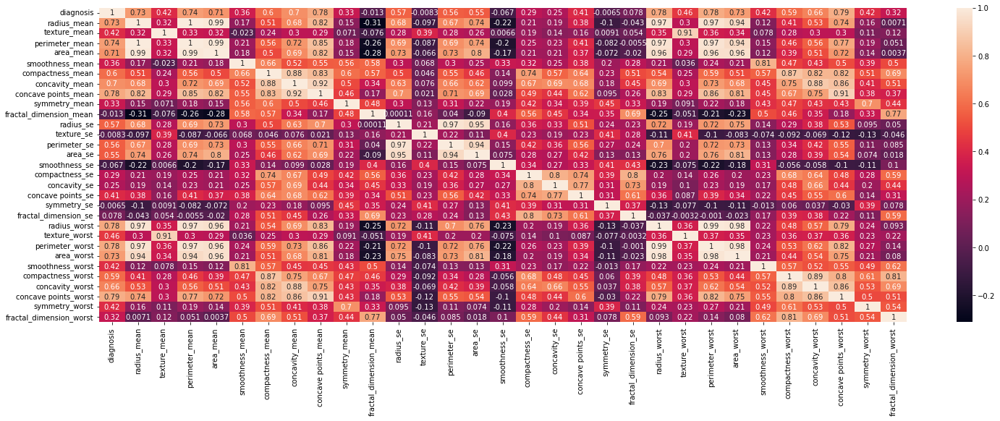

In [25]:
# Display the Correlation Matrix Using Headmap
plt.figure(figsize=(25,8))
sns.heatmap(corr, annot = True)
plt.show()

In [26]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, classification_report, RocCurveDisplay
from sklearn.preprocessing import StandardScaler

### Feature Engineering

Feature engineering is the process of selecting, transforming, and creating new featuresfrom raw data to improve the performance of machine learning models. The goal of feature engineering is to extract the most useful information from the data and create a representation that is suitable for the specific problem being solved.

### Label Encoding

Here we Encode M as 1 and B as 0

In [27]:
df["diagnosis"]=[1 if each=="M" else 0 for each in df["diagnosis"]]

In [28]:
# Split datainot training and test set
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer
from sklearn.metrics import accuracy_score

In [29]:
# load the breast cancer dataset
df = load_breast_cancer()

In [30]:
X_train, X_test, y_train, y_test = train_test_split(df.data, df.target, test_size=0.2, random_state=42)

In [31]:
#traindf, testdf = train_test_split(df, test_size = 0.3)

In [32]:
print("Shape of Training dataset: ", X_train.shape)
print("ShaXpe of Testing dataset: ", X_test.shape)

Shape of Training dataset:  (455, 30)
ShaXpe of Testing dataset:  (114, 30)


### Feature Scaling

Feature scaling is a technique used in machine learning to standardize the range of features (i.e., input variables) used in a model. It is important because many machine learning algorithms use a distance-based metric to measure the similarity between instances in the dataset. If the range of values for the features varies widely, some features may dominate the algorithm and lead to biased predictions.

In [33]:
# Scaling our dataset 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler() 
scaler.fit(X_train) 

X_train = scaler.transform(X_train) 
X_test = scaler.transform(X_test) 

### Model Building and Performation Evaluation

Model building and performance evaluation are two important steps in machine learning. Model building involves creating a machine learning model using an algorithm and training data. Performance evaluation involves assessing how well the model performs on new, unseen data. Here are some steps involved in each of these processes.

### Logistic Regression 

Logistic regression is widely used for classification of discrete data. In this case we will use it for binary (1,0) classification.

Based on the observations in the histogram plots, we can reasonably hypothesize that the cancer diagnosis depends on the mean cell radius, mean perimeter, mean area, mean compactness, mean concavity and mean concave points. We can then perform a logistic regression analysis using those features as follows:

In [34]:
model = LogisticRegression()

In [35]:
model.fit(X_train, y_train)

LogisticRegression()

In [36]:
y_pred = model.predict(X_test)

In [37]:
y_pred

array([1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       0, 1, 0, 0])

In [38]:
# evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9736842105263158


In [39]:
from sklearn import metrics
confusion = metrics.confusion_matrix(y_test, y_pred)
confusion

array([[41,  2],
       [ 1, 70]], dtype=int64)

In [40]:
accuracy_score(y_test,y_pred)

0.9736842105263158

In [41]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.98      0.95      0.96        43
           1       0.97      0.99      0.98        71

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



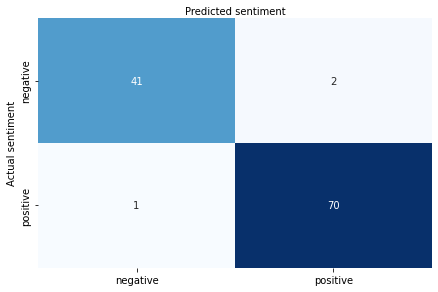

In [42]:
class_names = ["negative", "positive"]
fig,ax = plt.subplots()


sns.heatmap(pd.DataFrame(confusion), annot=True, cmap="Blues", fmt="d", cbar=False, xticklabels=class_names, yticklabels=class_names)
ax.xaxis.set_label_position('top')
plt.tight_layout()
plt.ylabel('Actual sentiment')
plt.xlabel('Predicted sentiment');

### Decision Tree

A decision tree is a model used in machine learning and data mining for making decisions based on a set of rules or conditions. It is a tree-like structure where each internal node represents a decision based on a particular feature, and each leaf node represents a class label or a numerical value.

Decision trees are used in various fields, such as finance, engineering, and medicine, for making predictions and classification tasks. They are easy to interpret and can handle both categorical and numerical data. One of the advantages of decision trees is that they can handle missing values and outliers. Decision trees can be used for both regression and classification tasks.

In [43]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer
from sklearn.metrics import accuracy_score

In [44]:
# load the breast cancer dataset
df = load_breast_cancer()

In [45]:
# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df.data, df.target, test_size=0.2, random_state=42)

In [46]:
# create a decision tree classifier model
model = DecisionTreeClassifier()

In [47]:
# train the model on the training data
model.fit(X_train, y_train)

DecisionTreeClassifier()

In [48]:
# make predictions on the testing data
y_pred = model.predict(X_test)

In [49]:
# evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9385964912280702


In [50]:
#Confusion metrrics
from sklearn import metrics
confusion = metrics.confusion_matrix(y_test, y_pred)
confusion

array([[40,  3],
       [ 4, 67]], dtype=int64)

In [51]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92        43
           1       0.96      0.94      0.95        71

    accuracy                           0.94       114
   macro avg       0.93      0.94      0.93       114
weighted avg       0.94      0.94      0.94       114



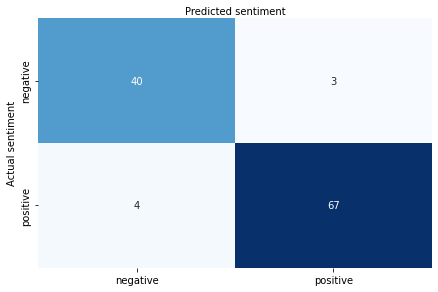

In [52]:
class_names = ["negative", "positive"]
fig,ax = plt.subplots()


sns.heatmap(pd.DataFrame(confusion), annot=True, cmap="Blues", fmt="d", cbar=False, xticklabels=class_names, yticklabels=class_names)
ax.xaxis.set_label_position('top')
plt.tight_layout()
plt.ylabel('Actual sentiment')
plt.xlabel('Predicted sentiment');

### Random Forest

Random Forest is an ensemble learning method that combines multiple decision trees to improve accuracy and stability of predictions. It uses random subsets of the training data and features to train individual trees, and makes the final prediction by taking a majority vote or averaging the predictions of all the trees. Random Forest is popular due to its high accuracy and robustness, but can be computationally expensive and difficult to interpret for large datasets.

In [53]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer
from sklearn.metrics import accuracy_score

In [54]:
# load the breast cancer dataset
data = load_breast_cancer()

In [55]:
# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.2, random_state=42)

In [56]:
# create a random forest classifier model
model = RandomForestClassifier()

In [57]:
# train the model on the training data
model.fit(X_train, y_train)

RandomForestClassifier()

In [58]:
# make predictions on the testing data
y_pred = model.predict(X_test)

In [59]:
# evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.956140350877193


In [60]:
from sklearn import metrics
confusion = metrics.confusion_matrix(y_test, y_pred)
confusion

array([[40,  3],
       [ 2, 69]], dtype=int64)

In [61]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94        43
           1       0.96      0.97      0.97        71

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



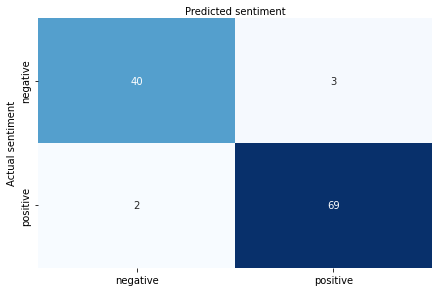

In [62]:
class_names = ["negative", "positive"]
fig,ax = plt.subplots()


sns.heatmap(pd.DataFrame(confusion), annot=True, cmap="Blues", fmt="d", cbar=False, xticklabels=class_names, yticklabels=class_names)
ax.xaxis.set_label_position('top')
plt.tight_layout()
plt.ylabel('Actual sentiment')
plt.xlabel('Predicted sentiment');

### Conclusion

I have done Data processing , Data Cleaning , Exploratory data analysis and have done various Machine learning models such as Logistic Regression , Decision Tree , Random Forest models and i got various Accuracies for all three different models such as i got 0.9736842105263158 for Logistic Regression and 0.9385964912280702 for Decision Tree and  0.956140350877193 for Random Forest. I got good accuracy in Logistic Regression model , so we can use this model for the better predictions.  